# **Ninjacart: CV_Classification**
Ninjacart, India’s leading fresh produce supply chain company, uses technology to deliver vegetables from farms to businesses within 12 hours. To automate sorting and quality control, they aim to classify images of vegetables like onions, potatoes, and tomatoes, as well as identify unrelated market scenes as noise. The provided dataset contains labeled images across these four categories to build a robust image classifier.

<h3><b>How Ninjacart works</b><br>

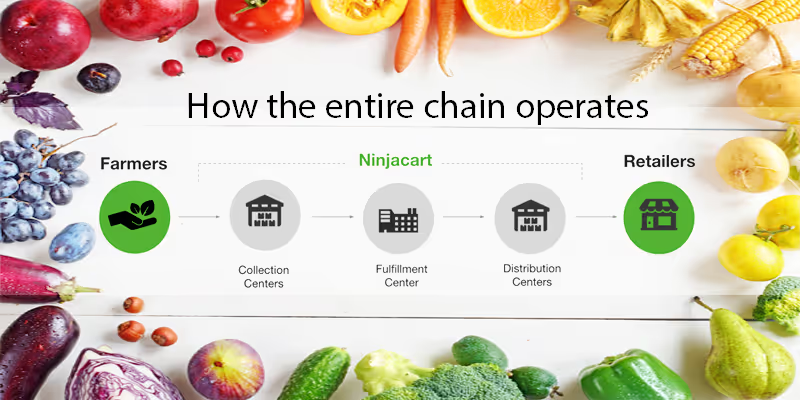

### **Objective:**
- The goal is to develop a multiclass image classification model that can:

  - Accurately identify onions, potatoes, tomatoes, and market scenes.
  - Support Ninjacart’s automation in sorting and supply chain efficiency.




##**Dataset Information:**
Dataset: [ninjacart_data](https://drive.google.com/file/d/1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT/view?usp=sharing)

### **Dataset Summary:**
The dataset is divided into two main folders: train and test.
Each contains four subfolders representing the classes:Indian market(noise),onion, potato and tomato.


**Data Collection:**

The images in this dataset were scraped from Google.


**Content**

- This dataset contains a folder train, which has a total of 3135 images, split into four folders as follows:

  - Tomato : 789
  
  - Potato : 898

  - Onion : 849

  - Indian market : 599


- This dataset contains another folder test which has a total of 351 images, split into four folders

  - Tomato : 106

  - potato : 83

  - onion : 81

  - Indian market : 81

# **Loading the "ninjacart_data" Dataset:**
Before loading the dataset we will import following libraries like TensorFlow, keras, matplotlib, opencv, seaborn etc.

In [ ]:
import os
import glob
import random
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
from tensorflow.keras import layers, models

from sklearn import metrics
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard
import datetime

from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input

from tensorflow.keras.applications import ResNet101
# from tensorflow.keras.applications.resnet101 import preprocess_input

from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.utils import to_categorical

In [ ]:
# pip install gdown

In [ ]:
# Downloading our Dataset from Google drive using gdown command

!gdown https://drive.google.com/uc?id=1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT

Downloading...
From (original): https://drive.google.com/uc?id=1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT
From (redirected): https://drive.google.com/uc?id=1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT&confirm=t&uuid=8ed2b320-ed78-4cc2-b24d-fc96df37c53d
To: /content/ninjacart_data.zip
100% 275M/275M [00:05<00:00, 47.1MB/s]


In [1]:
# Unzipping the ninjacart_data

# !unzip -o ninjacart_data.zip

# **Basic Exploration of Data:**

In [ ]:
train_dir = 'ninjacart_data/train'
test_dir = 'ninjacart_data/test'


<h3> Now let's plot some random images from our Dataset from each class !

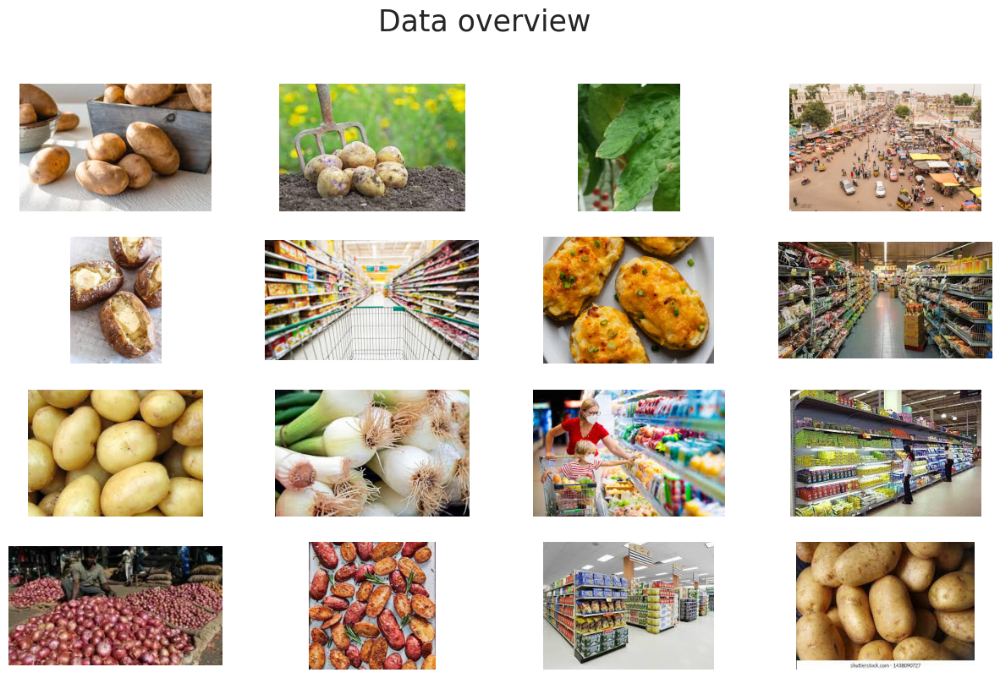

In [ ]:
train_folder = 'ninjacart_data/train'

images = []
for folder in os.listdir(train_folder):
  for image in os.listdir(train_folder + '/' + folder):
    images.append(os.path.join(train_folder, folder, image))

fig = plt.figure(1, figsize=(15, 9))
fig.suptitle('Data overview', fontsize=25)
plt.axis('off')
n = 0
for i in range(16):
  n += 1
  random_img = random.choice(images)
  imgs = tf.keras.utils.load_img(random_img)
  plt.subplot(4, 4, n)
  plt.axis('off')
  plt.imshow(imgs)

plt.show()

In [ ]:
class_dirs = os.listdir("/content/ninjacart_data/train") # list all directories inside "train" folder
image_dict = {} # dict to store image array(key) for every class(value)
count_dict = {} # dict to store count of files(key) for every class(value)
count_dict_test={}
print('Total Classes : ',class_dirs)
print()

# iterate over all class_dirs
for cls in class_dirs:
    # get list of all paths inside the subdirectory
    file_paths = glob.glob(f'/content/ninjacart_data/train/{cls}/*')
    #print(file_paths)
    count_dict[cls]=len(file_paths)
    image_path=random.choice(file_paths)
    image_dict[cls]=tf.keras.utils.load_img(image_path)

print('Training data - Total Images : \n',count_dict)
print()

for cls in class_dirs:
    # get list of all paths inside the subdirectory
    file_paths = glob.glob(f'/content/ninjacart_data/test/{cls}/*')
    count_dict_test[cls]=len(file_paths)

print('Test data - Total Images : \n',count_dict_test)
print()

Total Classes :  ['potato', 'indian market', 'tomato', 'onion']

Training data - Total Images : 
 {'potato': 898, 'indian market': 599, 'tomato': 789, 'onion': 849}

Test data - Total Images : 
 {'potato': 81, 'indian market': 81, 'tomato': 106, 'onion': 83}



### **Image Dimensions Analysis:**

<h4>Plot a Grid of training samples from each class to display their dimensions.

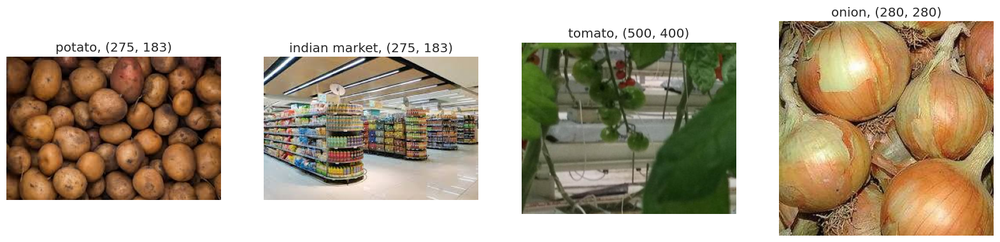

In [ ]:
# Viz Random Sample Images from each class

plt.figure(figsize=(20, 15))
# iterate over dictionary items (class label, image array)
for i, (cls,img) in enumerate(image_dict.items()):
    # create a subplot axis
    ax = plt.subplot(3, 4, i + 1)
    # plot each image
    plt.imshow(img)
    # set "class name" along with "image size" as title
    plt.title(f'{cls}, {img.size}')
    plt.axis("off")

- We can see, our Dataset consists of uneven sized images !
- We have some images of the market, which we will label as class 'noise'.
- To feed this data into our models, we need to preprocess it

### **Class Distribution Analysis:**
- Let's visualize how many samples of each class we have and if there's any class imbalance or not.
- Plotting our Class distributions using our image_dict and count_dict which stores the images for each class along with its count.
- We also feed our count_dict to a Dataframe to print the count for each class in our training and test directories.

Count of training samples per class:
            class  count
0         potato    898
1  indian market    599
2         tomato    789
3          onion    849


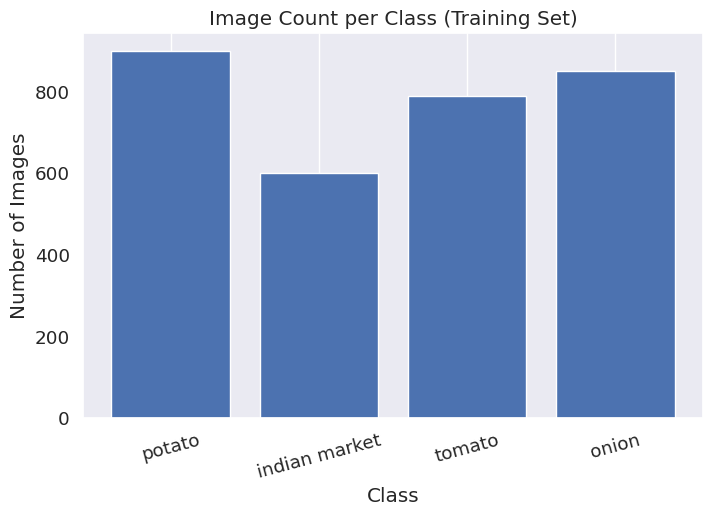

In [ ]:
# Let's now Plot the Data Distribution of Training Data across Classes

df_count_train = pd.DataFrame({
    "class": count_dict.keys(),     # keys of count_dict are class labels
    "count": count_dict.values(),   # value of count_dict contain counts of each class
})
print("Count of training samples per class:\n", df_count_train)

# Plot using matplotlib
plt.figure(figsize=(8, 5))
plt.bar(df_count_train['class'], df_count_train['count'])
plt.title("Image Count per Class (Training Set)")
plt.xlabel("Class")
plt.ylabel("Number of Images")
plt.xticks(rotation=15)
plt.grid(axis='y')
plt.show()

- From the above plot, we can see that our Data is not evenly distributed, but is also not imbalanced, so we are good to go !

- But what about the minority class (*indian market*) ?
    - We will use some {techniques} before feeding images to our network so that our model is generalized and is not biased for any class !

Count of training samples per class:
            class  count
0         potato     81
1  indian market     81
2         tomato    106
3          onion     83


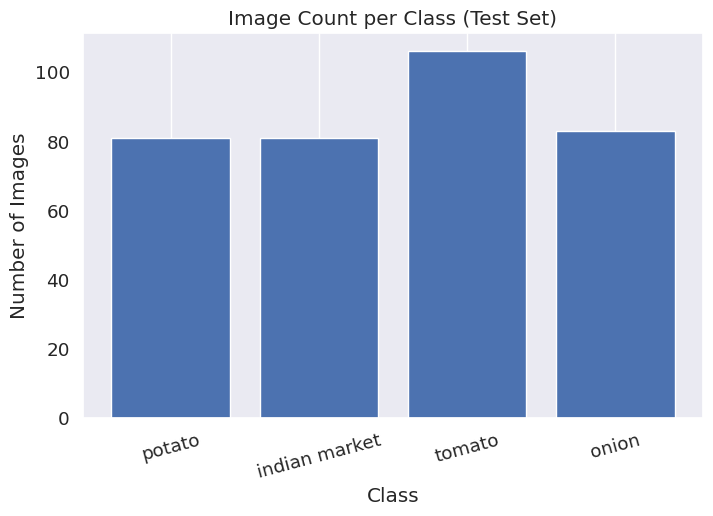

In [ ]:
# Let's now Plot the Data Distribution of Test Data across Classes

df_count_test = pd.DataFrame({
    "class": count_dict.keys(),     # keys of count_dict are class labels
    "count": count_dict_test.values(),   # value of count_dict_test contain counts of each class in test data
})
print("Count of training samples per class:\n", df_count_test)

# Plot using matplotlib
plt.figure(figsize=(8, 5))
plt.bar(df_count_test['class'], df_count_test['count'])
plt.title("Image Count per Class (Test Set)")
plt.xlabel("Class")
plt.ylabel("Number of Images")
plt.xticks(rotation=15)
plt.grid(axis='y')
plt.show()

# **Prepraring Data for Model Building:**

### Mounting the Dataset:
Now that we have analyzed and Explored our Raw Data, now to feed our Data into our model,
- Every image needs to be labelled according to its class and converted to a tensor.
- We will split our data into 3 sets : Train, Test and Validation.

For this task, we will use `tf.keras.utils.image_dataset_from_directory`, which will :

- Create an **(image, label)** pair for every image
- Automatically label the images using one-hot encoding
  - Eg : An image in the folder *indian market* will be labelled as **[1, 0, 0, 0]**
  - Since we have 4 classes, our classes will be one-hot encoded **alphabetically**,
  - meaning our first class is indian market, fourth will be tomato.

- Batching (Grouping) images together according to *batch_size*.
- Resize the Images to the shape ***(256, 256)***.
- Seed the shuffling of our images, so that it shuffles in a 'fixed' way

  - which will be used to create our validation data

- Splitting 20% of our training data for validation.
- Shuffling the data according to the `seed`.

In [ ]:
# Loading and splitting the 'train' data into 80% training and 20% validation data
image_size = (256, 256)
batch_size = 64
train_ds, val_ds=tf.keras.utils.image_dataset_from_directory('/content/ninjacart_data/train',
                                                            label_mode = 'categorical',
                                                            image_size = image_size,
                                                            batch_size = batch_size,
                                                            validation_split=0.2,
                                                            subset='both',
                                                            shuffle=True,
                                                            seed=42)
# Loading test data
test_ds=tf.keras.utils.image_dataset_from_directory('/content/ninjacart_data/test',
                                                    label_mode = 'categorical',
                                                    image_size = image_size,
                                                    batch_size = batch_size,
                                                    shuffle=False)            # keep order for the confusion matrix later)

Found 3135 files belonging to 4 classes.
Using 2508 files for training.
Using 627 files for validation.
Found 351 files belonging to 4 classes.


- `label_mode = 'categorical'` one-hot encodes the classes **alphabetically,** So here **indian market** (which we consider noise) = class 1 and **tomato** = class 4

In [ ]:
# Rescale and Prepare Data

# # Normalize pixel values between 0 and 1
# normalization_layer = tf.keras.layers.Rescaling(1./255)

# x_train = train_ds.map(lambda x, y: (normalization_layer(x), y))
# x_val = val_ds.map(lambda x, y: (normalization_layer(x), y))

# **Defining Some functions for repeatative Use:**

In [ ]:
def plot_acc_loss(model_history):

  fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(15,5))
  ax = axes.ravel()

  n_epochs = len(model_history.history['loss'])

  #accuracy graph
  ax[0].plot(range(0, n_epochs), [acc * 100 for acc in model_history.history['acc']], label='Train', color='b')
  ax[0].plot(range(0, n_epochs), [acc * 100 for acc in model_history.history['val_acc']], label='Val', color='r')
  ax[0].set_title('Accuracy vs. epoch', fontsize=15)
  ax[0].set_ylabel('Accuracy', fontsize=15)
  ax[0].set_xlabel('epoch', fontsize=15)
  ax[0].legend()

  #loss graph
  ax[1].plot(range(0, n_epochs), model_history.history['loss'], label='Train', color='b')
  ax[1].plot(range(0, n_epochs), model_history.history['val_loss'], label='Val', color='r')
  ax[1].set_title('Loss vs. epoch', fontsize=15)
  ax[1].set_ylabel('Loss', fontsize=15)
  ax[1].set_xlabel('epoch', fontsize=15)
  ax[1].legend()

  #display the graph
  plt.show()

In [ ]:
noise_path = 'ninjacart_data/test/indian market'
onion_path = 'ninjacart_data/test/onion'
potato_path = 'ninjacart_data/test/potato'
tomato_path = 'ninjacart_data/test/tomato'


def classwise_accuracy(class_path, class_name, model_name) :
    paths = []
    for i in os.listdir(class_path):
        paths.append(class_path + "/" + str(i))

    correct = 0
    total = 0

    for i in range(len(paths)):
        total+= 1

        img = tf.keras.utils.load_img(paths[i])
        img = tf.keras.utils.img_to_array(img)
        img = tf.image.resize(img, (256, 256))
        img = tf.expand_dims(img, axis = 0)

        pred = model_name.predict(img, verbose=0)
        if tf.argmax(pred[0]) == class_names.index(f"{class_name}"):
            correct+= 1

    print(f"Accuracy for class {class_name} is {round((correct/total)*100, 2)}% consisting of {len(paths)} images")

In [ ]:
def ConfusionMatrix(class_path, pred_list, model_name) :
    noise, tomato, potato, onion = 0, 0, 0, 0
    for i in os.listdir(class_path):

        img = tf.keras.utils.load_img(class_path + "/" + str(i))
        img = tf.keras.utils.img_to_array(img)
        img = tf.image.resize(img, (256, 256))
        img = tf.expand_dims(img, axis = 0)

        pred = model_name.predict(img, verbose=0)
        predicted = tf.argmax(pred, 1).numpy().item()

        if predicted == 0:
            noise+= 1
        elif predicted == 1:
            onion+= 1
        elif predicted == 2:
            potato+= 1
        else:
            tomato+= 1


    for item in noise, onion, potato, tomato :
        pred_list.append(item)

# **1. CNN Classifier Model:**
Let's build a baseline CNN Architecture with some Convolutional blocks which MaxPooling.

In [ ]:
# Build model
cnn_model = tf.keras.Sequential([
    tf.keras.layers.Rescaling(1./255, input_shape = (*image_size, 3)),

    tf.keras.layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
    tf.keras.layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
    tf.keras.layers.MaxPool2D(pool_size = (2,2)),

    tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
    tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
    tf.keras.layers.MaxPool2D(pool_size = (2,2)),

    tf.keras.layers.Conv2D(filters = 128, kernel_size = (3,3), padding = 'Same', activation = 'relu'),

    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(4, activation = 'softmax')
    ])

# Compile
cnn_model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss=tf.keras.losses.CategoricalCrossentropy(),
    metrics=[tf.keras.metrics.CategoricalAccuracy(name='acc'),
             tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall')]
)


cnn_model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_6 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 256, 256, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 256, 256, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 128, 128, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 139,940 (546.64 KB)

 Trainable params: 139,940 (546.64 KB)

 Non-trainable params: 0 (0.00 B)

### **Training the cnn_model:**

In [ ]:
history = cnn_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=20
)

Epoch 1/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 18s 350ms/step - acc: 0.2574 - loss: 1.3809 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_acc: 0.2791 - val_loss: 1.3300 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 12s 287ms/step - acc: 0.3620 - loss: 1.3106 - precision: 0.1463 - recall: 1.5924e-04 - val_acc: 0.6140 - val_loss: 1.1525 - val_precision: 0.7500 - val_recall: 0.0096
Epoch 3/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 21s 296ms/step - acc: 0.6054 - loss: 1.0814 - precision: 0.8316 - recall: 0.1161 - val_acc: 0.6236 - val_loss: 0.8924 - val_precision: 0.7602 - val_recall: 0.4753
Epoch 4/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 21s 319ms/step - acc: 0.6741 - loss: 0.8598 - precision: 0.8277 - recall: 0.4754 - val_acc: 0.6778 - val_loss: 0.7785 - val_precision: 0.7778 - val_recall: 0.5359
Epoch 5/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 19s 288ms/step - acc: 0.7357 - loss: 0.7476 - precision: 0.8328 - recall: 0.5753 - val_acc: 0.6954 - val_loss: 0.7501 - val_precision: 0.7

### **Plotting our Model's performance:**

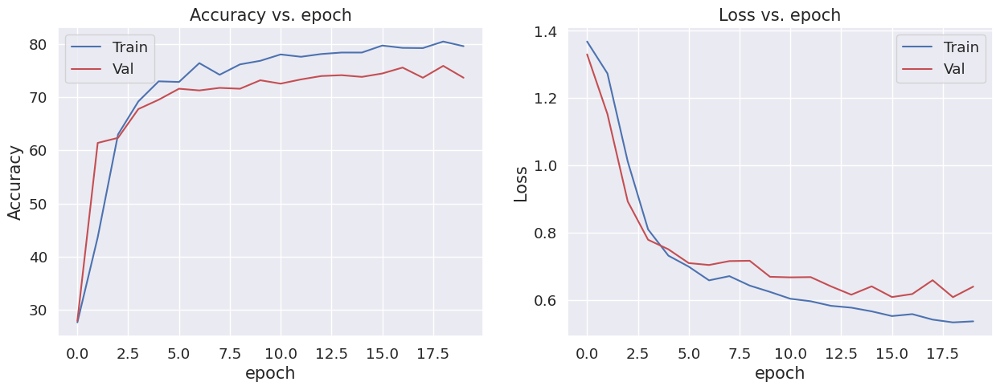

In [ ]:
# Plot for Training vs Validation Accuracy and loss
plot_acc_loss(history)

### **Testing the model:**

We list all the files in our test directory and append their complete paths to a list *test_images* which we will use to test our model by predicting on on random unseen data.

In [ ]:
test_images = []

for folder in os.listdir(test_dir):
  for image in os.listdir(test_dir + '/' + folder):
    test_images.append(os.path.join(test_dir, folder, image))

### Random Sample testing:
To test our model on a random sample :

  - Read a random image from test_images list containing paths of all test images.
  - Resize an image to (256, 256).
  - Add an extra dimension to our image's first dimension index.
  - Predict on the image using model.predict().

In [ ]:
class_names = ['indian market', 'tomato', 'potato', 'onion']
def grid_test_model(model_name):

  fig = plt.figure(1, figsize=(17, 11))
  plt.axis('off')
  n = 0
  for i in range(8):
    n += 1

    img_0 = tf.keras.utils.load_img(random.choice(test_images))
    img_0 = tf.keras.utils.img_to_array(img_0)
    img_0 = tf.image.resize(img_0, (256, 256))
    img_1 = tf.expand_dims(img_0, axis = 0)

    pred = model_name.predict(img_1)
    predicted_label = tf.argmax(pred, 1).numpy().item()

    for item in pred :
      item = tf.round((item*100))

    plt.subplot(2, 4, n)
    plt.axis('off')
    plt.title(f'prediction : {class_names[predicted_label]}\n\n'
              f'{item[0]} % {class_names[0]}\n'
              f'{item[1]} % {class_names[1]}\n'
              f'{item[2]} % {class_names[2]}\n'
              f'{item[3]} % {class_names[3]}\n')
    plt.imshow(img_0/255)
  plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


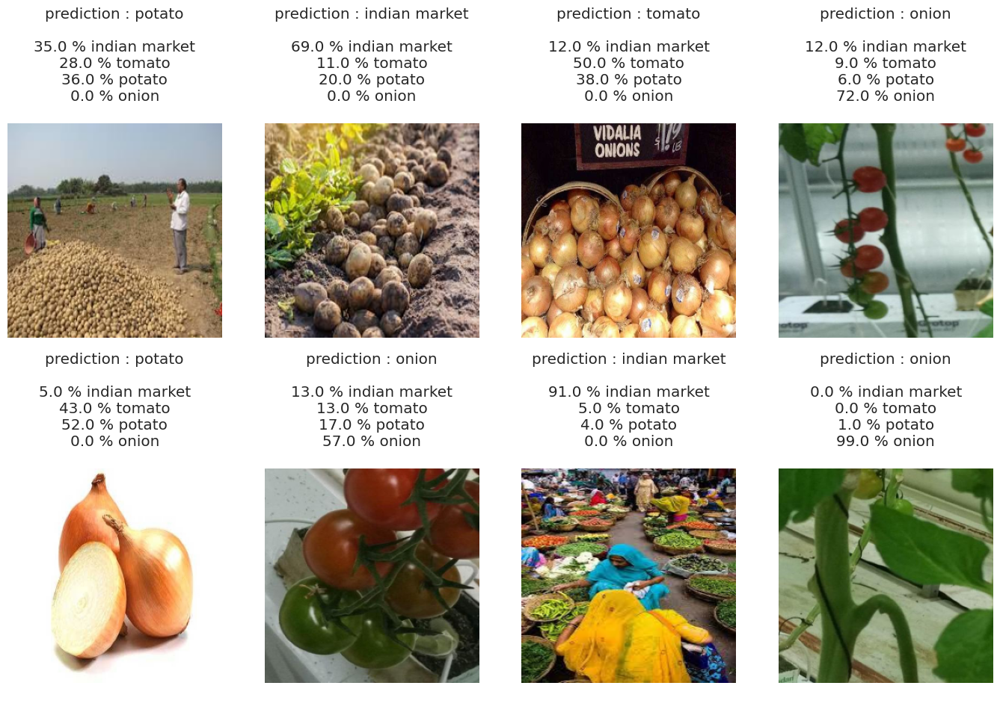

In [ ]:
grid_test_model(cnn_model)

- By observing the above plot, we can analyze that our Model is **not too sure** of the correct class....
  - We have to revamp our model to increase its confidence.

- Also, notice how our images are evenly sized (128x128) now !

### **Evaluating accuracy on each class:**
First we specify paths of each of our test classes

  - We define a function classwise_accuracy which calculates accuracy for each class by taking in class path and model.
  - We append all the file paths for the input class in a list
  from which we predict on all images and check if the label and predicted label are equal,
  according to which we calculate the accuracy of our model on the input class.

In [ ]:
classwise_accuracy(noise_path, 'indian market', cnn_model)
classwise_accuracy(onion_path, 'onion', cnn_model)
classwise_accuracy(potato_path, 'potato', cnn_model)
classwise_accuracy(tomato_path, 'tomato', cnn_model)

Accuracy for class indian market is 74.07% consisting of 81 images
Accuracy for class onion is 1.2% consisting of 83 images
Accuracy for class potato is 69.14% consisting of 81 images
Accuracy for class tomato is 3.77% consisting of 106 images


### **Plotting the Confusion Matrix:**

- We define four empty lists, in which we will store predicted classes by our model for a particular class images.
- We defined a function `confusion_matrix` which takes in the path of the class, empty list and the model.
- The function reads an image from the given path, resizes it and converts to RGB.
- Add an extra dimension at first index of the image and predict on the image with the input model.
- Check which class the model has predicted the image belongs to and append +1 to the index of the class.
  - Eg : If the model predicts that the image belongs to class tomato
  - we will append +1 at the fourth index(3) of our list like [0, 0, 0, 1]
- After calculating the value in our 4 lists for each class,
<br>we combine them, which gives us the confusion matrix of our model and plot them with seaborn.

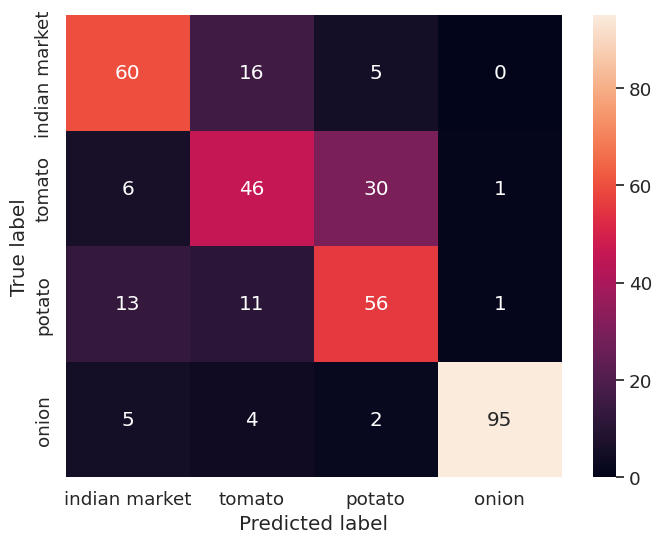

In [ ]:
sns.set(rc={'figure.figsize':(8, 6)})
sns.set(font_scale=1.2)


noise, tomato, potato, onion = 0, 0, 0, 0

l1 = []
l2 = []
l3 = []
l4 = []

ConfusionMatrix(noise_path, l1, cnn_model)
ConfusionMatrix(onion_path, l2, cnn_model)
ConfusionMatrix(potato_path, l3, cnn_model)
ConfusionMatrix(tomato_path, l4, cnn_model)

ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, annot=True, fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

In [ ]:
result = cnn_model.evaluate(test_ds)
dict(zip(cnn_model.metrics_names, result))

6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - acc: 0.7160 - loss: 0.6328 - precision: 0.7756 - recall: 0.6734


{'loss': 0.6238468289375305, 'compile_metrics': 0.7350427508354187}

- We can observe that our basline CNN model has a categorical cross entropy loss of ~ 0.5
- which indicates overfitting, now let's work on how we can improve our model's performance by using some certain techniques !

## **Model Tuning - Solving Overfitting:**

### **Augmenting our Data:**
- Data Augmentation introduces our model to different aspects and visualizaitons of class images, therefore increasing model generalization.
- We apply 3 types of augmentation on our training dataset.
  - `RandomFlip` : randomly flips images horizontally and vertically during training.

  - `RandomRotation` : randomly rotates images during training by a factor.
  
  - `RandomTranslation` : randomly translates images during training by a shift factor.

In [ ]:
# Data Augmentation

from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.layers import RandomFlip, RandomRotation, RandomTranslation

augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomTranslation(height_factor = 0.2, width_factor=0.2)
])


AUTOTUNE = tf.data.AUTOTUNE
train_ds = (train_ds
            .map(lambda x, y: (augmentation(x, training=True), y),
                 num_parallel_calls=AUTOTUNE)
            .prefetch(AUTOTUNE))
val_ds   = val_ds.prefetch(AUTOTUNE)
test_ds  = test_ds.prefetch(AUTOTUNE)

### **Adding BatchNormalization and Dropout:**
We add `Dropout()` and `BatchNormalization()` to our model architecture, which will help in improving its generalization.
<br><br>
How do they help ?
- `Dropout()` : Drops out random neurons while training which forces the model to focus on every feature for prediction.

- `BatchNormalization()` : Normalizes the inputs from previous layer for every mini-batch before sending it to the next layer.
<br>Help in mantaining the distribution of our data by making it a normal distribution (mean = 0, std. = 1).

In [ ]:
imaze_size = (256, 256)

In [ ]:
# Model with BatchNormalization + Dropout

cnn_model_revamp = tf.keras.Sequential([

tf.keras.layers.Rescaling(1./255,  input_shape=(*imaze_size, 3)),

tf.keras.layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.BatchNormalization(),
tf.keras.layers.MaxPool2D(pool_size = (2,2)),

tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.BatchNormalization(),
tf.keras.layers.MaxPool2D(pool_size = (2,2)),

tf.keras.layers.Conv2D(filters = 128, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.BatchNormalization(),
tf.keras.layers.GlobalAveragePooling2D(),
tf.keras.layers.Dropout(rate = 0.2),

tf.keras.layers.Dense(4, activation = 'softmax')
])

cnn_model_revamp.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss=tf.keras.losses.CategoricalCrossentropy(),
    metrics=[tf.keras.metrics.CategoricalAccuracy(name='acc'),
             tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall')]
)


cnn_model_revamp.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_7 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 256, 256, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 256, 256, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 256, 256, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 128, 128, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 128, 128, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 64, 64, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_5      │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 140,836 (550.14 KB)

 Trainable params: 140,388 (548.39 KB)

 Non-trainable params: 448 (1.75 KB)

### **Implementing Callbacks:**

We specify some callbacks to improve our model training process :
- `TensorBoard` : Enable visualizations for TensorBoard for our model's metrics, which we will plot later.

- `ModelCheckpoint` : Callback to save the model weights at a given frequency,
<br> saves the best model having the lowest 'val_loss' by default.

- `EarlyStopping` : Stop training when a monitored metric (val_loss) has stopped improving,
<br>after waiting for 5 epochs, specified by `patience=5`.

In [ ]:
log_dir_cnn_model_tuned = "logs/Custom_CNN_revamp"

callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
    ModelCheckpoint("best_augmented_cnn_model.h5", save_best_only=True, monitor='val_loss'),
    TensorBoard(log_dir=log_dir_cnn_model_tuned, histogram_freq=1)
]

In [ ]:
history_1 = cnn_model_revamp.fit(
    train_ds,
    epochs=20,
    validation_data=val_ds,
    callbacks=callbacks
)

Epoch 1/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 945ms/step - acc: 0.4871 - loss: 1.1271 - precision: 0.6567 - recall: 0.2876

40/40 ━━━━━━━━━━━━━━━━━━━━ 51s 1s/step - acc: 0.4905 - loss: 1.1211 - precision: 0.6598 - recall: 0.2919 - val_acc: 0.2935 - val_loss: 1.3825 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 920ms/step - acc: 0.7831 - loss: 0.6032 - precision: 0.8308 - recall: 0.6948

40/40 ━━━━━━━━━━━━━━━━━━━━ 42s 995ms/step - acc: 0.7832 - loss: 0.6027 - precision: 0.8308 - recall: 0.6952 - val_acc: 0.3046 - val_loss: 1.3464 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 961ms/step - acc: 0.8274 - loss: 0.4921 - precision: 0.8720 - recall: 0.7657

40/40 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - acc: 0.8269 - loss: 0.4929 - precision: 0.8715 - recall: 0.7653 - val_acc: 0.4689 - val_loss: 1.3019 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 4/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - acc: 0.8064 - loss: 0.5074 - precision: 0.8507 - recall: 0.7529

40/40 ━━━━━━━━━━━━━━━━━━━━ 85s 1s/step - acc: 0.8065 - loss: 0.5072 - precision: 0.8508 - recall: 0.7530 - val_acc: 0.4561 - val_loss: 1.2623 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 5/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - acc: 0.8236 - loss: 0.4595 - precision: 0.8705 - recall: 0.7686

40/40 ━━━━━━━━━━━━━━━━━━━━ 88s 1s/step - acc: 0.8237 - loss: 0.4594 - precision: 0.8705 - recall: 0.7688 - val_acc: 0.3987 - val_loss: 1.2098 - val_precision: 1.0000 - val_recall: 0.1388
Epoch 6/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 924ms/step - acc: 0.8284 - loss: 0.4460 - precision: 0.8622 - recall: 0.7910

40/40 ━━━━━━━━━━━━━━━━━━━━ 41s 969ms/step - acc: 0.8284 - loss: 0.4462 - precision: 0.8623 - recall: 0.7910 - val_acc: 0.3748 - val_loss: 1.1885 - val_precision: 0.8182 - val_recall: 0.2440
Epoch 7/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - acc: 0.8325 - loss: 0.4361 - precision: 0.8730 - recall: 0.7935

40/40 ━━━━━━━━━━━━━━━━━━━━ 51s 1s/step - acc: 0.8325 - loss: 0.4362 - precision: 0.8730 - recall: 0.7934 - val_acc: 0.3573 - val_loss: 1.1593 - val_precision: 0.6445 - val_recall: 0.2632
Epoch 8/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - acc: 0.8364 - loss: 0.4525 - precision: 0.8691 - recall: 0.7907 - val_acc: 0.3365 - val_loss: 1.2346 - val_precision: 0.4565 - val_recall: 0.2679
Epoch 9/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 954ms/step - acc: 0.8596 - loss: 0.4012 - precision: 0.8924 - recall: 0.8138

40/40 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - acc: 0.8596 - loss: 0.4013 - precision: 0.8924 - recall: 0.8137 - val_acc: 0.4498 - val_loss: 1.0702 - val_precision: 0.5801 - val_recall: 0.2887
Epoch 10/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 955ms/step - acc: 0.8411 - loss: 0.4084 - precision: 0.8772 - recall: 0.8043

40/40 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - acc: 0.8412 - loss: 0.4081 - precision: 0.8773 - recall: 0.8045 - val_acc: 0.5183 - val_loss: 0.9945 - val_precision: 0.6453 - val_recall: 0.3365
Epoch 11/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 946ms/step - acc: 0.8774 - loss: 0.3533 - precision: 0.8994 - recall: 0.8420

40/40 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - acc: 0.8770 - loss: 0.3540 - precision: 0.8991 - recall: 0.8416 - val_acc: 0.6204 - val_loss: 0.8628 - val_precision: 0.7755 - val_recall: 0.4242
Epoch 12/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 937ms/step - acc: 0.8603 - loss: 0.3754 - precision: 0.8903 - recall: 0.8181

40/40 ━━━━━━━━━━━━━━━━━━━━ 40s 982ms/step - acc: 0.8602 - loss: 0.3757 - precision: 0.8902 - recall: 0.8181 - val_acc: 0.6922 - val_loss: 0.7818 - val_precision: 0.8221 - val_recall: 0.4864
Epoch 13/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 945ms/step - acc: 0.8719 - loss: 0.3464 - precision: 0.8998 - recall: 0.8395

40/40 ━━━━━━━━━━━━━━━━━━━━ 41s 990ms/step - acc: 0.8718 - loss: 0.3468 - precision: 0.8998 - recall: 0.8393 - val_acc: 0.7879 - val_loss: 0.5474 - val_precision: 0.8763 - val_recall: 0.6555
Epoch 14/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 958ms/step - acc: 0.8727 - loss: 0.3420 - precision: 0.9042 - recall: 0.8413

40/40 ━━━━━━━━━━━━━━━━━━━━ 43s 1s/step - acc: 0.8726 - loss: 0.3423 - precision: 0.9041 - recall: 0.8412 - val_acc: 0.8022 - val_loss: 0.5151 - val_precision: 0.8681 - val_recall: 0.7033
Epoch 15/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - acc: 0.8753 - loss: 0.3404 - precision: 0.9010 - recall: 0.8479 - val_acc: 0.7831 - val_loss: 0.5608 - val_precision: 0.8436 - val_recall: 0.6970
Epoch 16/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 946ms/step - acc: 0.8740 - loss: 0.3433 - precision: 0.8916 - recall: 0.8457

40/40 ━━━━━━━━━━━━━━━━━━━━ 41s 992ms/step - acc: 0.8739 - loss: 0.3437 - precision: 0.8915 - recall: 0.8455 - val_acc: 0.8389 - val_loss: 0.4230 - val_precision: 0.8859 - val_recall: 0.7799
Epoch 17/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - acc: 0.8870 - loss: 0.3214 - precision: 0.9093 - recall: 0.8616

40/40 ━━━━━━━━━━━━━━━━━━━━ 50s 1s/step - acc: 0.8869 - loss: 0.3216 - precision: 0.9092 - recall: 0.8615 - val_acc: 0.8421 - val_loss: 0.4102 - val_precision: 0.8763 - val_recall: 0.8022
Epoch 18/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 952ms/step - acc: 0.8757 - loss: 0.3358 - precision: 0.9076 - recall: 0.8444

40/40 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - acc: 0.8756 - loss: 0.3359 - precision: 0.9073 - recall: 0.8443 - val_acc: 0.8262 - val_loss: 0.4053 - val_precision: 0.8574 - val_recall: 0.7959
Epoch 19/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - acc: 0.8792 - loss: 0.3255 - precision: 0.9046 - recall: 0.8534

40/40 ━━━━━━━━━━━━━━━━━━━━ 52s 1s/step - acc: 0.8792 - loss: 0.3258 - precision: 0.9044 - recall: 0.8533 - val_acc: 0.8246 - val_loss: 0.4040 - val_precision: 0.8513 - val_recall: 0.7943
Epoch 20/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 71s 996ms/step - acc: 0.8806 - loss: 0.3261 - precision: 0.9043 - recall: 0.8571 - val_acc: 0.8421 - val_loss: 0.4196 - val_precision: 0.8581 - val_recall: 0.8198


In [ ]:
result = cnn_model_revamp.evaluate(test_ds)
dict(zip(cnn_model_revamp.metrics_names, result))

6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 335ms/step - acc: 0.6551 - loss: 0.7239 - precision: 0.6550 - recall: 0.6330


{'loss': 0.5513391494750977, 'compile_metrics': 0.7492877244949341}

In [ ]:
classwise_accuracy(noise_path, 'indian market', cnn_model_revamp)
classwise_accuracy(onion_path, 'onion', cnn_model_revamp)
classwise_accuracy(potato_path, 'potato', cnn_model_revamp)
classwise_accuracy(tomato_path, 'tomato', cnn_model_revamp)

Accuracy for class indian market is 39.51% consisting of 81 images
Accuracy for class onion is 0.0% consisting of 83 images
Accuracy for class potato is 58.02% consisting of 81 images
Accuracy for class tomato is 0.0% consisting of 106 images


<h3> We observe an <b>accuracy jump of ~10 %</b> by just :

- Applying augmentation to our data.
- Adding Dropout and BatchNormalization.
- Implementing callbacks during training.

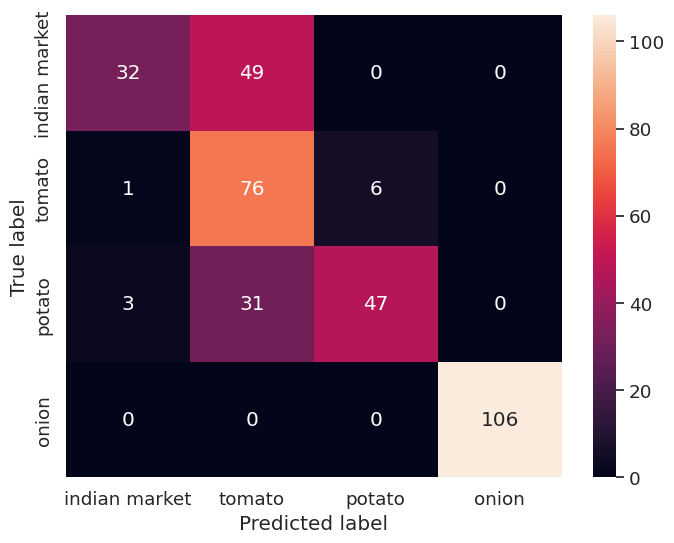

In [ ]:
sns.set(rc={'figure.figsize':(8, 6)})
sns.set(font_scale=1.2)


noise, tomato, potato, onion = 0, 0, 0, 0

l1 = []
l2 = []
l3 = []
l4 = []


ConfusionMatrix(noise_path, l1, cnn_model_revamp)
ConfusionMatrix(onion_path, l2, cnn_model_revamp)
ConfusionMatrix(potato_path, l3, cnn_model_revamp)
ConfusionMatrix(tomato_path, l4, cnn_model_revamp)

ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, annot=True, fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

<h4>In the Confusion matrix plotted above, we can observe that :

- Our model can easily differentiate between all classes with minimal error.
- Potato and onion are the most confusing classes for our model.
- Tomato can be easily differentiated with the smallest error.

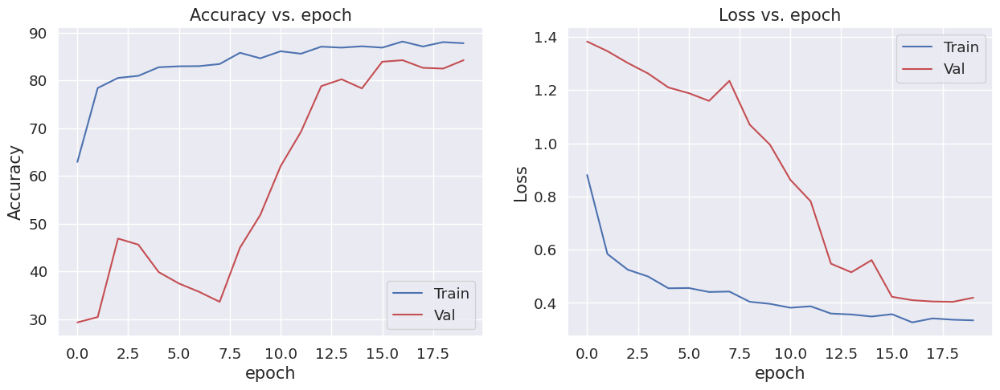

In [ ]:
plot_acc_loss(history_1)

### Applying Transfer Learning:

- Now that we solved overfitting problem of our Baseline model.
- Let's also explore and implement some state-of-the-art model architectures which can give us even higher precision and accuracy.

- We explored some of the available pretrained model which we can finetune to our data,
<br> We will train 3 of the most efficient and accurate pretrained models on the ImageNet dataset.

The Models we will use :
- VGG-19
- ResNet
- MobileNet

# **2. VGG19_Model:**

In [ ]:
augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomTranslation(height_factor = 0.2, width_factor=0.2)
])


AUTOTUNE = tf.data.AUTOTUNE
train_ds = (train_ds
            .map(lambda x, y: (augmentation(x, training=True), y),
                 num_parallel_calls=AUTOTUNE)
            .prefetch(AUTOTUNE))
val_ds   = val_ds.prefetch(AUTOTUNE)
test_ds  = test_ds.prefetch(AUTOTUNE)

In [ ]:
# load base model
pretrained_model_1 = tf.keras.applications.vgg19.VGG19(input_shape=(256, 256, 3), include_top = False)

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


In [ ]:
# append classification layer
VGG19_model = pretrained_model_1.output

VGG19_model=tf.keras.Sequential([
    tf.keras.layers.Rescaling(1./255, input_shape = (*image_size, 3)),
    pretrained_model_1,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(rate = 0.1),
    tf.keras.layers.Dense(4, activation = 'softmax')
    ])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
VGG19_model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss=tf.keras.losses.CategoricalCrossentropy(),
    metrics=[tf.keras.metrics.CategoricalAccuracy(name='acc'),
             tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall')]
)


VGG19_model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_3 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vgg19 (Functional)              │ (None, 8, 8, 512)      │    20,024,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,026,436 (76.39 MB)

 Trainable params: 20,026,436 (76.39 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# callbacks for VGG19
log_dir_VGG19_model = "logs/VGG19"

callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
    ModelCheckpoint("VGG19_model.h5", save_best_only=True, monitor='val_loss'),
    TensorBoard(log_dir=log_dir_VGG19_model, histogram_freq=1)
]

In [ ]:
history_2 = VGG19_model.fit(train_ds, validation_data = val_ds, epochs = 20, callbacks=callbacks)

Epoch 1/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - acc: 0.3282 - loss: 1.3709 - precision: 0.3899 - recall: 0.0777

40/40 ━━━━━━━━━━━━━━━━━━━━ 263s 4s/step - acc: 0.3304 - loss: 1.3672 - precision: 0.3939 - recall: 0.0796 - val_acc: 0.3780 - val_loss: 1.1770 - val_precision: 0.5103 - val_recall: 0.3541
Epoch 2/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - acc: 0.6330 - loss: 0.8540 - precision: 0.7123 - recall: 0.5285

40/40 ━━━━━━━━━━━━━━━━━━━━ 107s 3s/step - acc: 0.6346 - loss: 0.8514 - precision: 0.7136 - recall: 0.5304 - val_acc: 0.7687 - val_loss: 0.5635 - val_precision: 0.8078 - val_recall: 0.7305
Epoch 3/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 126s 3s/step - acc: 0.8127 - loss: 0.5218 - precision: 0.8637 - recall: 0.7527 - val_acc: 0.7671 - val_loss: 0.7382 - val_precision: 0.7949 - val_recall: 0.7480
Epoch 4/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - acc: 0.8239 - loss: 0.4696 - precision: 0.8597 - recall: 0.7919

40/40 ━━━━━━━━━━━━━━━━━━━━ 129s 3s/step - acc: 0.8242 - loss: 0.4687 - precision: 0.8600 - recall: 0.7922 - val_acc: 0.8549 - val_loss: 0.3835 - val_precision: 0.8831 - val_recall: 0.8309
Epoch 5/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 125s 3s/step - acc: 0.8365 - loss: 0.4040 - precision: 0.8614 - recall: 0.8068 - val_acc: 0.8437 - val_loss: 0.4592 - val_precision: 0.8581 - val_recall: 0.8198
Epoch 6/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - acc: 0.8761 - loss: 0.3357 - precision: 0.9083 - recall: 0.8511

40/40 ━━━━━━━━━━━━━━━━━━━━ 128s 3s/step - acc: 0.8760 - loss: 0.3360 - precision: 0.9081 - recall: 0.8511 - val_acc: 0.8820 - val_loss: 0.3339 - val_precision: 0.8945 - val_recall: 0.8517
Epoch 7/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - acc: 0.8886 - loss: 0.3120 - precision: 0.9059 - recall: 0.8614

40/40 ━━━━━━━━━━━━━━━━━━━━ 123s 3s/step - acc: 0.8884 - loss: 0.3125 - precision: 0.9057 - recall: 0.8612 - val_acc: 0.8995 - val_loss: 0.2733 - val_precision: 0.9088 - val_recall: 0.8900
Epoch 8/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 127s 3s/step - acc: 0.8959 - loss: 0.2781 - precision: 0.9171 - recall: 0.8804 - val_acc: 0.8437 - val_loss: 0.4305 - val_precision: 0.8586 - val_recall: 0.8325
Epoch 9/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - acc: 0.8764 - loss: 0.3107 - precision: 0.8899 - recall: 0.8578

40/40 ━━━━━━━━━━━━━━━━━━━━ 125s 3s/step - acc: 0.8764 - loss: 0.3112 - precision: 0.8900 - recall: 0.8578 - val_acc: 0.8979 - val_loss: 0.2730 - val_precision: 0.9070 - val_recall: 0.8868
Epoch 10/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 144s 3s/step - acc: 0.9005 - loss: 0.2816 - precision: 0.9163 - recall: 0.8790 - val_acc: 0.8676 - val_loss: 0.3603 - val_precision: 0.8799 - val_recall: 0.8533
Epoch 11/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 127s 3s/step - acc: 0.8914 - loss: 0.2875 - precision: 0.9119 - recall: 0.8739 - val_acc: 0.8852 - val_loss: 0.3430 - val_precision: 0.9013 - val_recall: 0.8740
Epoch 12/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 127s 3s/step - acc: 0.9165 - loss: 0.2278 - precision: 0.9276 - recall: 0.9040 - val_acc: 0.6906 - val_loss: 0.9061 - val_precision: 0.6976 - val_recall: 0.6842
Epoch 13/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 126s 3s/step - acc: 0.8422 - loss: 0.3837 - precision: 0.8703 - recall: 0.8209 - val_acc: 0.8931 - val_loss: 0.2984 - val_precision: 0.9002 - val_recall: 0.8915
Epoch 14/20


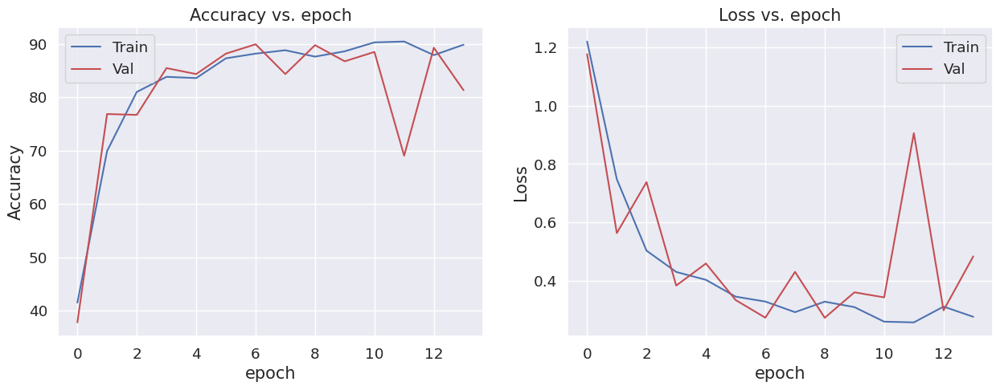

In [ ]:
# Evaluating VGG19_model
plot_acc_loss(history_2)

In [ ]:
classwise_accuracy(noise_path, 'indian market', VGG19_model)
classwise_accuracy(onion_path, 'onion', VGG19_model)
classwise_accuracy(potato_path, 'potato', VGG19_model)
classwise_accuracy(tomato_path, 'tomato', VGG19_model)

Accuracy for class indian market is 86.42% consisting of 81 images
Accuracy for class onion is 0.0% consisting of 83 images
Accuracy for class potato is 79.01% consisting of 81 images
Accuracy for class tomato is 0.0% consisting of 106 images


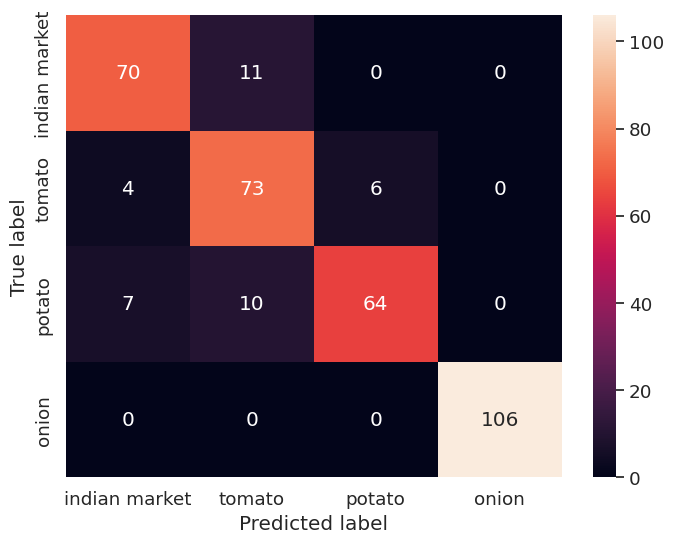

In [ ]:
# ConfusionMatrix
l1 = []
l2 = []
l3 = []
l4 = []

ConfusionMatrix(noise_path, l1, VGG19_model)
ConfusionMatrix(onion_path, l2, VGG19_model)
ConfusionMatrix(potato_path, l3, VGG19_model)
ConfusionMatrix(tomato_path, l4, VGG19_model)

ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, annot=True, fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

In [ ]:
result = VGG19_model.evaluate(test_ds)
dict(zip(VGG19_model.metrics_names, result))

6/6 ━━━━━━━━━━━━━━━━━━━━ 18s 3s/step - acc: 0.8762 - loss: 0.3819 - precision: 0.8939 - recall: 0.8700


{'loss': 0.3287508487701416, 'compile_metrics': 0.8917378783226013}

We achieved a test accuracy of **87%** on our finetuned VGG19 Model.

# **3. ResNet101_Model:**

In [ ]:
augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomTranslation(height_factor = 0.2, width_factor=0.2)
])


AUTOTUNE = tf.data.AUTOTUNE
train_ds = (train_ds
            .map(lambda x, y: (augmentation(x, training=True), y),
                 num_parallel_calls=AUTOTUNE)
            .prefetch(AUTOTUNE))
val_ds   = val_ds.prefetch(AUTOTUNE)
test_ds  = test_ds.prefetch(AUTOTUNE)

In [ ]:
# load base model
pretrained_model_2=tf.keras.applications.ResNet101(weights='imagenet',include_top=False,input_shape=(256,256,3))

In [ ]:
ResNet101_model=tf.keras.Sequential([
    tf.keras.layers.Rescaling(1./255, input_shape=(256,256,3)),
    pretrained_model_2,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(rate = 0.1),
    tf.keras.layers.Dense(4, activation = 'softmax')
    ])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
ResNet101_model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss=tf.keras.losses.CategoricalCrossentropy(),
    metrics=[tf.keras.metrics.CategoricalAccuracy(name='acc'),
             tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall')]
)
ResNet101_model.summary()

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_8 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet101 (Functional)          │ (None, 8, 8, 2048)     │    42,658,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_6      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 4)              │         8,196 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 42,666,372 (162.76 MB)

 Trainable params: 42,561,028 (162.36 MB)

 Non-trainable params: 105,344 (411.50 KB)

In [ ]:
# Callbacks for ResNet
log_dir_ResNet101_model = "logs/ResNet101"

callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
    ModelCheckpoint("ResNet101_model.h5", save_best_only=True, monitor='val_loss'),
    TensorBoard(log_dir=log_dir_ResNet101_model, histogram_freq=1)
]

In [ ]:
history_3 = ResNet101_model.fit(train_ds, validation_data = val_ds, epochs = 20, callbacks=callbacks)

Epoch 1/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - acc: 0.7854 - loss: 0.5295 - precision: 0.8505 - recall: 0.7325

40/40 ━━━━━━━━━━━━━━━━━━━━ 267s 4s/step - acc: 0.7881 - loss: 0.5232 - precision: 0.8526 - recall: 0.7360 - val_acc: 0.1627 - val_loss: 2.9475 - val_precision: 0.1616 - val_recall: 0.1611
Epoch 2/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - acc: 0.9633 - loss: 0.0987 - precision: 0.9679 - recall: 0.9611

40/40 ━━━━━━━━━━━━━━━━━━━━ 139s 3s/step - acc: 0.9633 - loss: 0.0986 - precision: 0.9679 - recall: 0.9612 - val_acc: 0.2791 - val_loss: 2.5872 - val_precision: 0.2804 - val_recall: 0.2791
Epoch 3/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 109s 3s/step - acc: 0.9808 - loss: 0.0481 - precision: 0.9822 - recall: 0.9800 - val_acc: 0.2935 - val_loss: 10.3213 - val_precision: 0.2935 - val_recall: 0.2935
Epoch 4/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 111s 3s/step - acc: 0.9839 - loss: 0.0477 - precision: 0.9851 - recall: 0.9834 - val_acc: 0.2919 - val_loss: 5.5276 - val_precision: 0.2919 - val_recall: 0.2919
Epoch 5/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 138s 3s/step - acc: 0.9878 - loss: 0.0346 - precision: 0.9877 - recall: 0.9861 - val_acc: 0.2935 - val_loss: 13.0034 - val_precision: 0.2935 - val_recall: 0.2935
Epoch 6/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 143s 3s/step - acc: 0.9841 - loss: 0.0486 - precision: 0.9841 - recall: 0.9834 - val_acc: 0.2935 - val_loss: 16.5846 - val_precision: 0.2935 - val_recall: 0.2935
Epoch 7/20
40

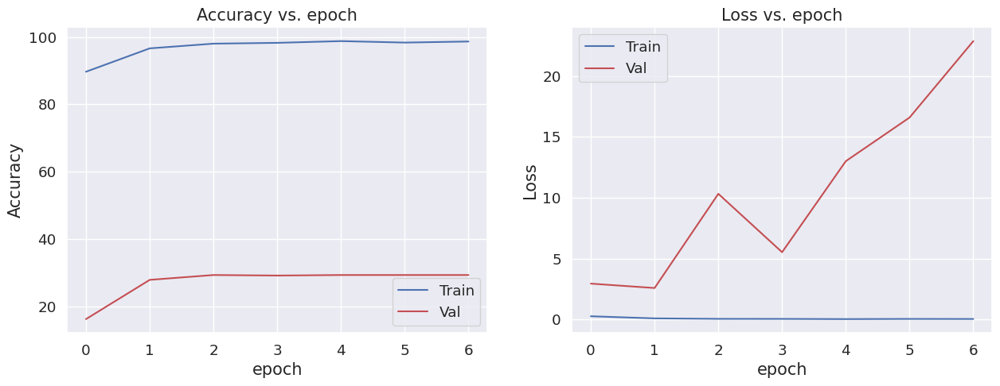

In [ ]:
# Evaluating ResNet101_model
plot_acc_loss(history_3)

In [ ]:
classwise_accuracy(noise_path, 'indian market', ResNet101_model)
classwise_accuracy(onion_path, 'onion', ResNet101_model)
classwise_accuracy(potato_path, 'potato', ResNet101_model)
classwise_accuracy(tomato_path, 'tomato', ResNet101_model)

Accuracy for class indian market is 0.0% consisting of 81 images
Accuracy for class onion is 0.0% consisting of 83 images
Accuracy for class potato is 100.0% consisting of 81 images
Accuracy for class tomato is 0.0% consisting of 106 images


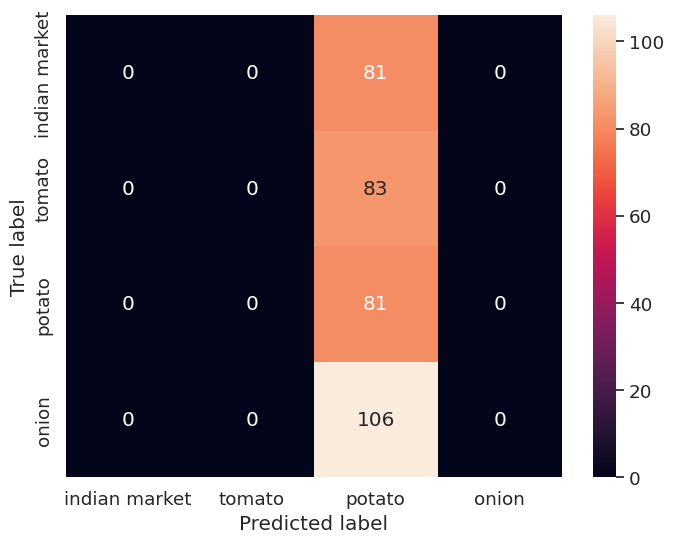

In [ ]:
# ConfusionMatrix
l1 = []
l2 = []
l3 = []
l4 = []

ConfusionMatrix(noise_path, l1, ResNet101_model)
ConfusionMatrix(onion_path, l2, ResNet101_model)
ConfusionMatrix(potato_path, l3, ResNet101_model)
ConfusionMatrix(tomato_path, l4, ResNet101_model)

ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, annot=True, fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

In [ ]:
result = ResNet101_model.evaluate(test_ds)
dict(zip(ResNet101_model.metrics_names, result))

6/6 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - acc: 0.1681 - loss: 2.2506 - precision: 0.1687 - recall: 0.1681


{'loss': 2.9233899116516113, 'compile_metrics': 0.23076923191547394}

We achieved a test accuracy of **94%** on our finetuned ResNet Model, let's finetune a smaller sized model to deploy on our Mobile App !

# **4. MobileNet_model:**

In [ ]:
augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomTranslation(height_factor = 0.2, width_factor=0.2)
])


AUTOTUNE = tf.data.AUTOTUNE
train_ds = (train_ds
            .map(lambda x, y: (augmentation(x, training=True), y),
                 num_parallel_calls=AUTOTUNE)
            .prefetch(AUTOTUNE))
val_ds   = val_ds.prefetch(AUTOTUNE)
test_ds  = test_ds.prefetch(AUTOTUNE)

In [ ]:
# load base model
pretrained_model_3 = tf.keras.applications.mobilenet.MobileNet(input_shape=(256, 256, 3), include_top = False)

<ipython-input-131-292bbd60ac87>:2: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  pretrained_model_3 = tf.keras.applications.mobilenet.MobileNet(input_shape=(256, 256, 3), include_top = False)


17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [ ]:
# append classification layer
MobileNet_model = pretrained_model_3.output

MobileNet_model = tf.keras.Sequential([
            #Normalizing 0-255 into 0 to 1
            tf.keras.layers.Rescaling(1./255, input_shape=(256, 256, 3)),
            pretrained_model_3,
            tf.keras.layers.GlobalAveragePooling2D(),
            tf.keras.layers.Dropout(rate = 0.1),
            tf.keras.layers.Dense(4, activation = 'softmax')
        ])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
# Callbacks for MobileNet
log_dir_MobileNet_model = "logs/MobileNet"

callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
    ModelCheckpoint("MobileNet_model.h5", save_best_only=True, monitor='val_loss'),
    TensorBoard(log_dir=log_dir_MobileNet_model, histogram_freq=1)
]

In [ ]:
MobileNet_model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss=tf.keras.losses.CategoricalCrossentropy(),
    metrics=[tf.keras.metrics.CategoricalAccuracy(name='acc'),
             tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall')]
)

In [ ]:
history_4 = MobileNet_model.fit(train_ds, validation_data = val_ds, epochs = 20, callbacks=callbacks)

Epoch 1/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - acc: 0.6216 - loss: 0.9492 - precision: 0.6638 - recall: 0.5404

40/40 ━━━━━━━━━━━━━━━━━━━━ 158s 3s/step - acc: 0.6255 - loss: 0.9397 - precision: 0.6678 - recall: 0.5452 - val_acc: 0.8565 - val_loss: 0.3883 - val_precision: 0.8848 - val_recall: 0.8453
Epoch 2/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - acc: 0.9084 - loss: 0.2366 - precision: 0.9194 - recall: 0.9000

40/40 ━━━━━━━━━━━━━━━━━━━━ 113s 3s/step - acc: 0.9087 - loss: 0.2360 - precision: 0.9197 - recall: 0.9003 - val_acc: 0.8900 - val_loss: 0.3066 - val_precision: 0.8950 - val_recall: 0.8836
Epoch 3/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - acc: 0.9486 - loss: 0.1497 - precision: 0.9541 - recall: 0.9410

40/40 ━━━━━━━━━━━━━━━━━━━━ 112s 3s/step - acc: 0.9486 - loss: 0.1498 - precision: 0.9541 - recall: 0.9410 - val_acc: 0.9490 - val_loss: 0.1659 - val_precision: 0.9520 - val_recall: 0.9490
Epoch 4/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - acc: 0.9480 - loss: 0.1279 - precision: 0.9530 - recall: 0.9457

40/40 ━━━━━━━━━━━━━━━━━━━━ 135s 2s/step - acc: 0.9481 - loss: 0.1277 - precision: 0.9531 - recall: 0.9459 - val_acc: 0.9633 - val_loss: 0.1022 - val_precision: 0.9649 - val_recall: 0.9633
Epoch 5/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - acc: 0.9617 - loss: 0.1004 - precision: 0.9634 - recall: 0.9579

40/40 ━━━━━━━━━━━━━━━━━━━━ 111s 3s/step - acc: 0.9615 - loss: 0.1007 - precision: 0.9633 - recall: 0.9578 - val_acc: 0.9777 - val_loss: 0.0792 - val_precision: 0.9776 - val_recall: 0.9761
Epoch 6/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 111s 3s/step - acc: 0.9741 - loss: 0.0744 - precision: 0.9754 - recall: 0.9732 - val_acc: 0.9633 - val_loss: 0.0929 - val_precision: 0.9664 - val_recall: 0.9633
Epoch 7/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 104s 2s/step - acc: 0.9794 - loss: 0.0724 - precision: 0.9808 - recall: 0.9762 - val_acc: 0.9585 - val_loss: 0.0900 - val_precision: 0.9600 - val_recall: 0.9569
Epoch 8/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - acc: 0.9807 - loss: 0.0549 - precision: 0.9813 - recall: 0.9799

40/40 ━━━━━━━━━━━━━━━━━━━━ 104s 3s/step - acc: 0.9806 - loss: 0.0552 - precision: 0.9813 - recall: 0.9798 - val_acc: 0.9697 - val_loss: 0.0731 - val_precision: 0.9712 - val_recall: 0.9665
Epoch 9/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 105s 2s/step - acc: 0.9755 - loss: 0.0723 - precision: 0.9774 - recall: 0.9738 - val_acc: 0.9394 - val_loss: 0.1874 - val_precision: 0.9409 - val_recall: 0.9394
Epoch 10/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 143s 2s/step - acc: 0.9811 - loss: 0.0526 - precision: 0.9819 - recall: 0.9806 - val_acc: 0.9442 - val_loss: 0.1629 - val_precision: 0.9442 - val_recall: 0.9442
Epoch 11/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 108s 3s/step - acc: 0.9748 - loss: 0.0600 - precision: 0.9780 - recall: 0.9737 - val_acc: 0.9266 - val_loss: 0.2761 - val_precision: 0.9265 - val_recall: 0.9250
Epoch 12/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 143s 3s/step - acc: 0.9867 - loss: 0.0413 - precision: 0.9875 - recall: 0.9863 - val_acc: 0.9059 - val_loss: 0.3057 - val_precision: 0.9058 - val_recall: 0.9043
Epoch 13/20
4

In [ ]:
MobileNet_model.summary()

Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_10 (Rescaling)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenet_1.00_224 (Functional) │ (None, 8, 8, 1024)     │     3,228,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_8      │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 4)              │         4,100 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 9,655,118 (36.83 MB)

 Trainable params: 3,211,076 (12.25 MB)

 Non-trainable params: 21,888 (85.50 KB)

 Optimizer params: 6,422,154 (24.50 MB)

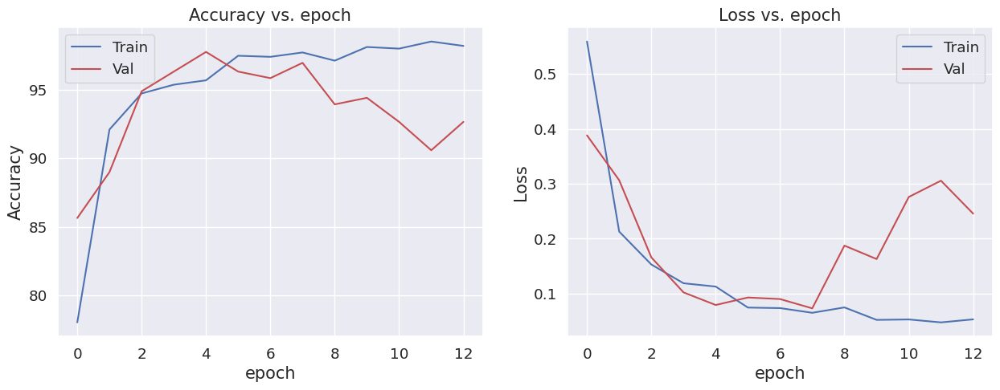

In [ ]:
# Evaluating MobileNet_model
plot_acc_loss(history_4)

In [ ]:
classwise_accuracy(noise_path, 'indian market', MobileNet_model)
classwise_accuracy(onion_path, 'onion', MobileNet_model)
classwise_accuracy(potato_path, 'potato', MobileNet_model)
classwise_accuracy(tomato_path, 'tomato', MobileNet_model)

Accuracy for class indian market is 75.31% consisting of 81 images
Accuracy for class onion is 0.0% consisting of 83 images
Accuracy for class potato is 77.78% consisting of 81 images
Accuracy for class tomato is 0.0% consisting of 106 images


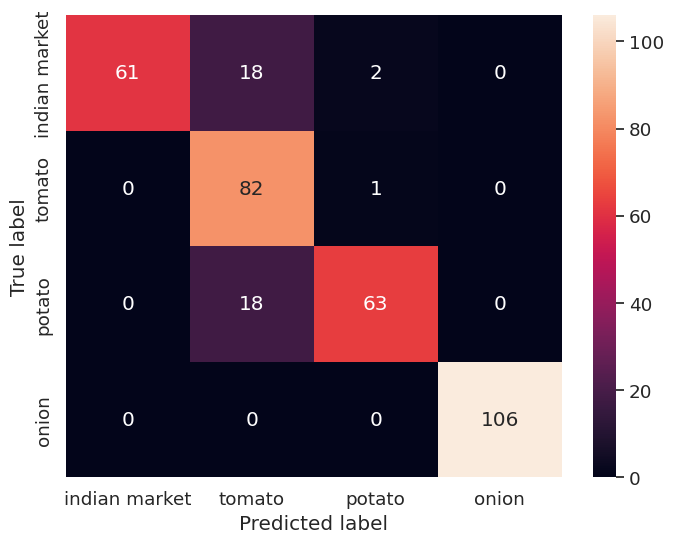

In [ ]:
# ConfusionMatrix
l1 = []
l2 = []
l3 = []
l4 = []

ConfusionMatrix(noise_path, l1, MobileNet_model)
ConfusionMatrix(onion_path, l2, MobileNet_model)
ConfusionMatrix(potato_path, l3, MobileNet_model)
ConfusionMatrix(tomato_path, l4, MobileNet_model)

ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, annot=True, fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

In [ ]:
result = MobileNet_model.evaluate(test_ds)
dict(zip(MobileNet_model.metrics_names, result))

6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 795ms/step - acc: 0.8483 - loss: 0.5595 - precision: 0.8526 - recall: 0.8446


{'loss': 0.3860427141189575, 'compile_metrics': 0.8917378783226013}

## **Models Comparison:**

### **Summary of Trained models:**


| Model | Test Acc| Train Acc
| --- | --- | ---|
| Custom CNN | 71% | 80% |
| CNN Revamp |  84%| 88% |
| VGG19 | 87% | 91% |
| ResNet101 | 94% | 99% |
| MobileNet | 90% | 100% |

<br>

- After training all of our Models, we found ResNet101 to be the most accurate model on our Dataset.

- Let's visualize all of our models via tensorboard from the logs we created during training.

- We observed that ResNet101 gave us the highest test accuracy and our baseline CNN gave us the lowest accuracy.

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

# **Testing our best model(ResNet):**

- ResNet achieved the highest accuracy of **94%** among all the models we trained.

- Let's test our Finetuned ResNet to predict on some random unseen data to visualize how accurate it is !

In [ ]:
ResNet101_model.summary()

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_8 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet101 (Functional)          │ (None, 8, 8, 2048)     │    42,658,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_6      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 4)              │         8,196 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 127,788,430 (487.47 MB)

 Trainable params: 42,561,028 (162.36 MB)

 Non-trainable params: 105,344 (411.50 KB)

 Optimizer params: 85,122,058 (324.71 MB)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


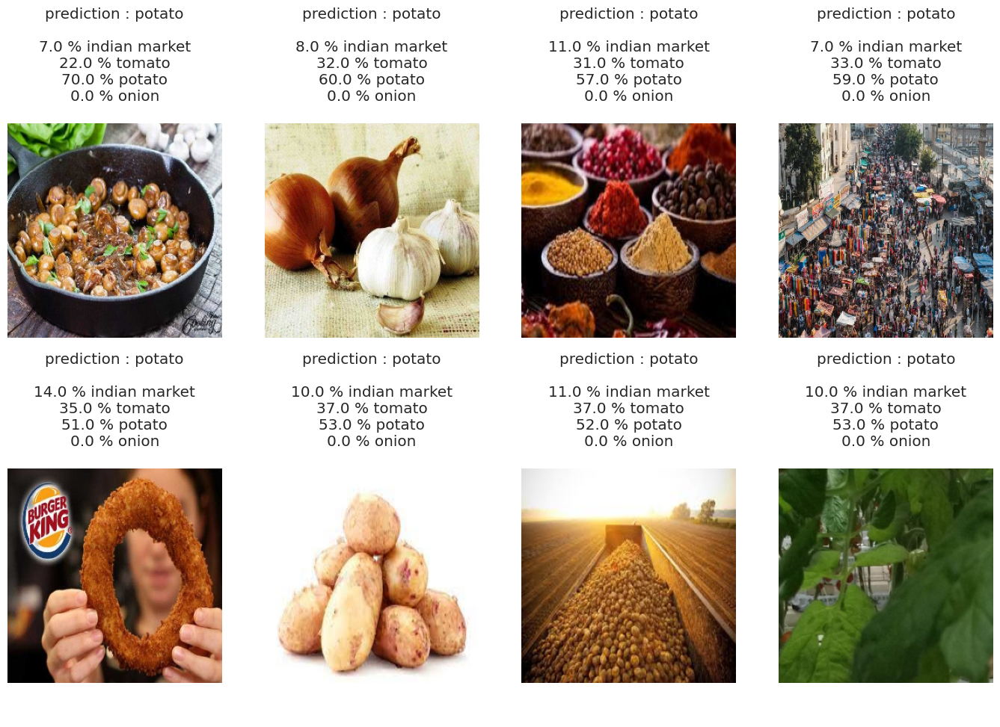

In [ ]:
grid_test_model(ResNet101_model)

We see that our Model is **nearly 100%** sure of the correct class in every image we plotted above,
<br>indicating a very good choice for our classfication task.

In [ ]:
result = ResNet101_model.evaluate(test_ds)
dict(zip(ResNet101_model.metrics_names, result))

6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 304ms/step - acc: 0.1681 - loss: 2.2506 - precision: 0.1687 - recall: 0.1681


{'loss': 2.9233899116516113, 'compile_metrics': 0.23076923191547394}

# **Summary:**
- This project focused on building and evaluating deep learning models to analyze Ninjacart's data to develop a multiclass image classification model that can accurately identify onions, potatoes, tomatoes and noise.
- Several architectures were explored, including a custom CNN, VGG16, MobileNet, and ResNet101.
- After rigorous training and validation, **ResNet101** emerged as the best-performing model, achieving an **accuracy of 94%** and outperforming all other candidates in key metrics such as precision, recall.Its deep architecture and residual learning capability allowed it to capture complex patterns in the dataset, making it highly effective for our use case.


# **Insights:**
- ResNet101's deep architecture allowed to overcome challenges such as vanishing gradients, which often hinder the training of very deep networks. This made it well-suited for the complexity of agricultural produce images/supply chain data from Ninjacart.

- While MobileNet offered faster training and lower inference time, it did not match ResNet101’s accuracy—suggesting that model performance was more critical than speed in this context, where quality/demand accuracy directly impacts business decisions.

- VGG16 and basic CNN models, while relatively deep, lacked skip connections, leading to overfitting and weaker generalization compared to ResNet101.

- These findings suggest that for tasks involving real-world, heterogeneous agricultural data, deeper models with architectural advantages (like ResNet’s residual learning) should be preferred, especially when accuracy and reliability are more important than model size.